# 필요한 패키지, 모듈, 함수 불러오기
* pip install scikit-learn
* pip install imgaug
* pip install pandas
* yolo.py 파일 수정

In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.layers import Input, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from sklearn.model_selection import train_test_split
from glob import glob
from os.path import join, basename, splitext, dirname
from xml.etree.ElementTree import ElementTree

from PIL import Image
from imgaug import augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

import datetime

from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib
from yolo import YOLO

import settings
from yolo3.model import preprocess_true_boxes, yolo_body, tiny_yolo_body, yolo_loss
from yolo3.utils import get_random_data

# GPU Dynamic Memory Allocation 활성화
tf.get_logger().setLevel('ERROR')

gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [2]:
def create_model(input_shape, anchors, num_classes, load_pretrained=True, freeze_body=2,
                 weights_path='model_data/yolo_weights.h5'):
    '''create the training model'''
    K.clear_session()  # get a new session
    image_input = Input(shape=(None, None, 3))
    h, w = input_shape
    num_anchors = len(anchors)

    y_true = [Input(shape=(h // {0: 32, 1: 16, 2: 8}[l], w // {0: 32, 1: 16, 2: 8}[l], \
                           num_anchors // 3, num_classes + 5)) for l in range(3)]

    model_body = yolo_body(image_input, num_anchors // 3, num_classes)
    print('Create YOLOv3 model with {} anchors and {} classes.'.format(num_anchors, num_classes))

    if load_pretrained:
        model_body.load_weights(weights_path, by_name=True, skip_mismatch=True)
        print('Load weights {}.'.format(weights_path))
        if freeze_body in [1, 2]:
            # Freeze darknet53 body or freeze all but 3 output layers.
            num = (185, len(model_body.layers) - 3)[freeze_body - 1]
            for i in range(num): model_body.layers[i].trainable = False
            print('Freeze the first {} layers of total {} layers.'.format(num, len(model_body.layers)))

    model_loss = Lambda(yolo_loss, output_shape=(1,), name='yolo_loss',
                        arguments={'anchors': anchors, 'num_classes': num_classes, 'ignore_thresh': 0.5})(
        [*model_body.output, *y_true])
    model = Model([model_body.input, *y_true], model_loss)

    return model

def create_tiny_model(input_shape, anchors, num_classes, load_pretrained=True, freeze_body=2,
                      weights_path='model_data/tiny_yolo_weights.h5'):
    '''create the training model, for Tiny YOLOv3'''
    K.clear_session()  # get a new session
    image_input = Input(shape=(None, None, 3))
    h, w = input_shape
    num_anchors = len(anchors)

    y_true = [Input(shape=(h // {0: 32, 1: 16}[l], w // {0: 32, 1: 16}[l], \
                           num_anchors // 2, num_classes + 5)) for l in range(2)]

    model_body = tiny_yolo_body(image_input, num_anchors // 2, num_classes)
    print('Create Tiny YOLOv3 model with {} anchors and {} classes.'.format(num_anchors, num_classes))

    if load_pretrained:
        model_body.load_weights(weights_path, by_name=True, skip_mismatch=True)
        print('Load weights {}.'.format(weights_path))
        if freeze_body in [1, 2]:
            # Freeze the darknet body or freeze all but 2 output layers.
            num = (20, len(model_body.layers) - 2)[freeze_body - 1]
            for i in range(num): model_body.layers[i].trainable = False
            print('Freeze the first {} layers of total {} layers.'.format(num, len(model_body.layers)))

    model_loss = Lambda(yolo_loss, output_shape=(1,), name='yolo_loss',
                        arguments={'anchors': anchors, 'num_classes': num_classes, 'ignore_thresh': 0.7})(
        [*model_body.output, *y_true])
    model = Model([model_body.input, *y_true], model_loss)

    return model

def steps(X, batch_size):
    """batch size에 대한 step의 크기를 계산합니다."""
    return (len(X) + 1) // batch_size if len(X) % batch_size else len(X) // batch_size

def normalize(X):
    """데이터를 정규화를 합니다."""
    return X / 255

def get_random_data(image, bbs, input_shape, max_boxes=20, transform=False):
    """이미지 증대 함수입니다."""
    image_ = np.array(Image.open(image))

    # 바운딩 박스 객체 생성
    bbs_ = BoundingBoxesOnImage([
        BoundingBox(x1=x1, x2=x2, y1=y1, y2=y2, label=label)
        for x1, y1, x2, y2, label in bbs
    ], shape=image_.shape) # 바운딩 박스 만들기(이미지와 같은 크기를 기준으로 만든다.)
    
    # 이미지와 바운딩 박스에 변환 함수 적용
    image_aug, bbs_aug = seq(
        image=image_,
        bounding_boxes=bbs_,
    ) if transform else iaa.Sequential([iaa.Resize(size=input_shape)])(
        image=image_, bounding_boxes=bbs_
    )
    
    # 바운딩 박스 + 클래스 번호 -> ndarray
    attrs = ['x1', 'y1', 'x2', 'y2', 'label']
    bb_data = []

    for i in range(max_boxes):
        if len(bbs) > i:
            bb_data.append([getattr(bbs_aug.bounding_boxes[i], attr) for attr in attrs])
        else:
            bb_data.append([0, 0, 0, 0, 0])
            
    bb_data = np.array(bb_data, dtype='float32')
    
    height, width = input_shape
    bb_data[:, [0, 2]] = np.clip(bb_data[:, [0, 2]], 0, width-1)
    bb_data[:, [1, 3]] = np.clip(bb_data[:, [1, 3]], 0, height-1)
    
    if np.all((bb_data[:, [2]] - bb_data[:, [0]]) <= 10) or np.all((bb_data[:, [3]] - bb_data[:, [1]]) <= 10):
        return get_random_data(image, bbs, input_shape, max_boxes=max_boxes, transform=transform)
    else:
        return normalize(image_aug.astype('float32')), bb_data

# 메모리 부족현상 방지를 위해서 제너레이터 사용한다.
def data_generator(images, bbs, batch_size, input_shape, anchors, num_classes, epochs=1, transform=False):
    steps_ = steps(images, batch_size)
    batch_order = np.arange(steps_)
    while epochs:
        np.random.shuffle(batch_order)  # 배치들간의 순서 섞기
        for order in batch_order:
            start = order * batch_size
            end   = start + batch_size
            
            image_box_data = [get_random_data(image, bb, input_shape, transform=transform)
                            for image, bb in zip(images[start:end], bbs[start:end])]
            
            image_data = np.array([image for image, _ in image_box_data])
            box_data = np.array([box for _, box in image_box_data])
            
            y_true = preprocess_true_boxes(box_data, input_shape, anchors, num_classes)
            yield [image_data, *y_true], np.zeros(batch_size)
        epochs -= 1

def load_model(input_shape, anchors, num_classes, weights_path):
    if len(anchors) == 6:
        model = create_tiny_model(input_shape, anchors, num_classes,
                                  freeze_body=2, weights_path=weights_path)
    else:
        model = create_model(input_shape, anchors, num_classes,
                             freeze_body=2,
                             weights_path=weights_path)  # make sure you know what you freeze
    return model

# 데이터 불러오기

In [3]:
# 품종 - 폴더 이름
path_to_dataset = r'C:\project\Machine Learning Project\yolov3\tf2-keras-yolo3-master\견종_10종'
Final_folder = join(path_to_dataset, '최종')

# 품종 이름
names = ['BEAGLE', 'BULLDOG','CHIHUAHUEÑO', 'GOLDEN RETRIEVER',
         'KOREA JINDO DOG', 'MALTESE', 'POMERANIAN', 'POODLE',
         'SHIH TZU', 'WELSH CORGI', ]
name_class = dict(zip(names, range(len(names))))
num_classes = len(names)

df = pd.read_csv(join(Final_folder, 'dog.csv'))

X = df.image.apply(lambda path: join(Final_folder, path))
y = df.loc[:, 'xmin':'breed'].to_numpy()[:, np.newaxis, :]
y[:, 0, -1] = df.breed.apply(lambda breed: name_class[breed])

X.shape, y.shape

((5897,), (5897, 1, 5))

In [4]:
print(f'{X[0]}\n{y[0]}')

C:\project\Machine Learning Project\yolov3\tf2-keras-yolo3-master\견종_10종\최종\#beaglelove\2022-02-03 10.30.07 2765151837156630276_47708451471.jpg
[[156 90 858 444 0]]


# 데이터 나누기

In [5]:
np.random.seed(0)
random_order = np.random.permutation(np.arange(len(X)))
X = X[random_order]
y = y[random_order]

# 100개씩 가져오기
num_data = 111
X_part = []
y_part = []
for breed in range(len(names)):
    mask = (y[:, :, -1].squeeze() == breed)
    X_part += list(X[mask][:num_data])
    y_part += list(y[mask][:num_data])

X = np.array(X_part)
y = np.array(y_part)
    
X.shape, y.shape

((1110,), (1110, 1, 5))

In [6]:
# 5%는 test set으로 설정한다.
X_train_all, X_test, y_train_all, y_test = train_test_split(X, y, stratify=y[:, :, -1],
                                                            test_size=0.05, random_state=0)

# 9:1의 비율로 train set, validation set을 나눈다.
X_train, X_val, y_train, y_val = train_test_split(X_train_all, y_train_all, stratify=y_train_all[:, :, -1],
                                                  test_size=0.0505, random_state=0)


persent = list(map(lambda arr: " / ".join([str(np.round(np.sum(arr[:, 0, -1].squeeze() == i)/len(arr), 2))
                                   for i in range(len(names))]),
               [y, y_train, y_val, y_test]))
print(
    f'len(y):\t\t{len(y)}\t{persent[0]}\n'
    f'len(y_train):\t{len(y_train)}\t{persent[1]}\n'
    f'len(y_val):\t{len(y_val)}\t{persent[2]}\n'
    f'len(y_test):\t{len(y_test)}\t{persent[3]}'
)

len(y):		1110	0.1 / 0.1 / 0.1 / 0.1 / 0.1 / 0.1 / 0.1 / 0.1 / 0.1 / 0.1
len(y_train):	1000	0.1 / 0.1 / 0.1 / 0.1 / 0.1 / 0.1 / 0.1 / 0.1 / 0.1 / 0.1
len(y_val):	54	0.09 / 0.09 / 0.11 / 0.09 / 0.11 / 0.09 / 0.09 / 0.09 / 0.11 / 0.11
len(y_test):	56	0.11 / 0.11 / 0.09 / 0.11 / 0.09 / 0.11 / 0.11 / 0.11 / 0.09 / 0.09


# 입력데이터 기본 설정

In [74]:
batch_size = 1
num_train = len(X_train)
num_val = len(X_val)
steps_per_epoch = steps(X_train, batch_size)
validation_steps = steps(X_val, batch_size)
epochs = 100
input_shape = (416, 416)
anchors = np.array(
    [(10,13), (16,30), (33,23), (30,61), (62,45), (59,119), (116,90), (156,198), (373,326)]).astype('float')

# 과적합 방지를 위해서 매번 입력 이미지를 변형한다.
seq = iaa.Sequential([
    iaa.Resize(size=input_shape),
    iaa.GammaContrast((0.9, 1.1)),
    iaa.Affine(translate_percent={'x': (-0.25, 0.25), 'y': (-0.25, 0.25)}, scale=(0.5, 1.2)),
    iaa.HorizontalFlip(0.5),
    iaa.Crop(percent=(0.0, 0.1)),
    iaa.GaussianBlur(sigma=(0, 1)),
    iaa.Sometimes(0.5, iaa.Multiply((0.8, 1.2), per_channel=0.1)),
    iaa.Sharpen(alpha=(0, 0.05)),
    iaa.Rotate(rotate=(-35, 35)),
])

In [75]:
# 바운딩 박스를 직접 이미지에 출력하기
def draw_box(arr, box):
    xmin, ymin, xmax, ymax = box
    height, width = arr.shape[:2]
    
    plt.figure(figsize=(12,12*(arr.shape[0]/arr.shape[1])))
    plt.imshow(arr)

    ax = plt.gca()
    rect = matplotlib.patches.Rectangle(
    (xmin, ymin), # 박스의 왼쪽 상단 점의 위치
    xmax-xmin,  # 박스의 가로 길이
    ymax-ymin,  # 박스의 세로 길이
    linewidth=2,
    edgecolor='cyan',
    fill = False,
    )

    ax.add_patch(rect)
    plt.show()

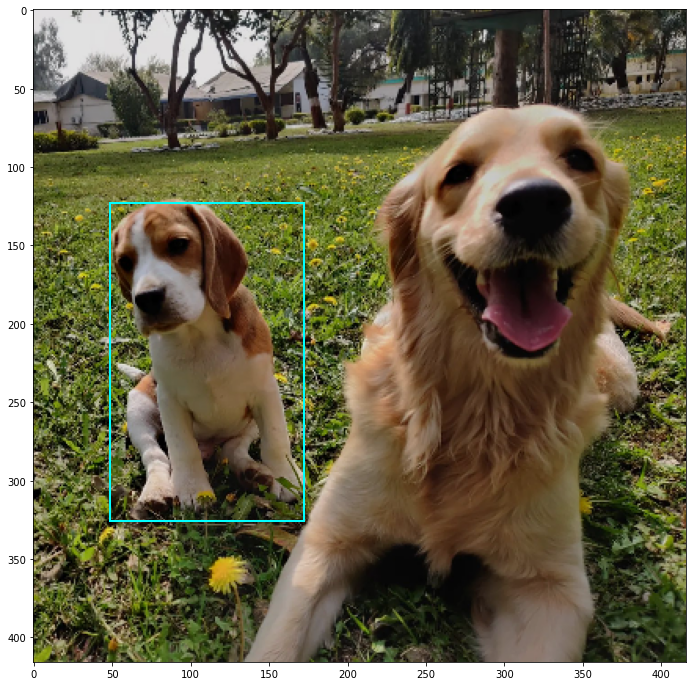

In [76]:
num = 23
tmp_ = get_random_data(X[num], y[num], (416, 416), transform=False)
draw_box((tmp_[0]*225).astype('uint8'), tmp_[1][0][:4])

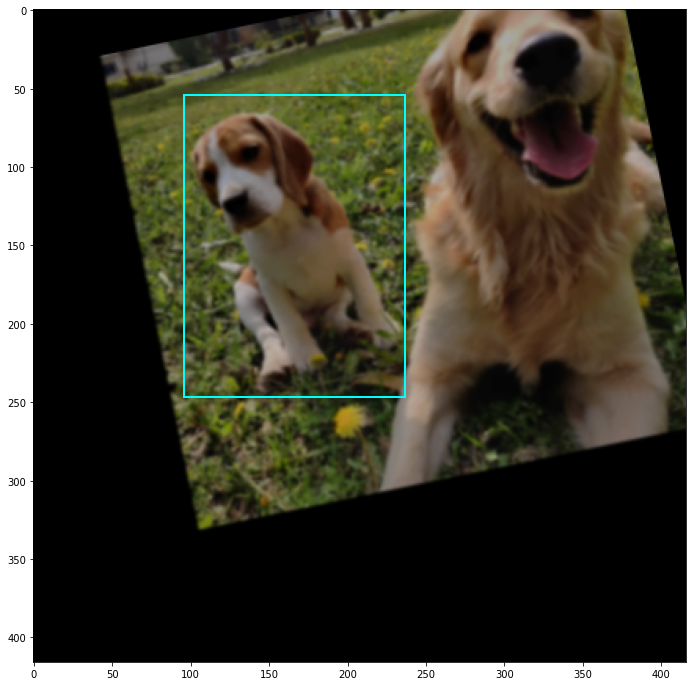

In [79]:
tmp_ = get_random_data(X[num], y[num], (416, 416), transform=True)
draw_box((tmp_[0]*225).astype('uint8'), tmp_[1][0][:4])

# 모델 불러오기 및 callback 설정

In [8]:
weights_path = r'C:\project\Machine Learning Project\yolov3\tf2-keras-yolo3-master\model_data\yolo_weights.h5'
model = load_model(input_shape, anchors, num_classes, weights_path)

log_dir = "./logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
logging = TensorBoard(log_dir=log_dir)
checkpoint = ModelCheckpoint(join(log_dir, 'ep{epoch:03d}-loss{loss:.3f}-val_loss{val_loss:.3f}.h5'),
                             monitor='val_loss', save_weights_only=True, save_best_only=True, period=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1,
                               restore_best_weights=True)

Create YOLOv3 model with 9 anchors and 10 classes.
Load weights C:\project\Machine Learning Project\yolov3\tf2-keras-yolo3-master\model_data\yolo_weights.h5.
Freeze the first 249 layers of total 252 layers.


# 데이터 학습

In [9]:
# Train with frozen layers first, to get a stable loss.
# Adjust num epochs to your dataset. This step is enough to obtain a not bad model.
if settings.FROZEN_TRAIN:
    model.compile(optimizer=Adam(learning_rate=settings.FROZEN_TRAIN_LR), loss={
        # use custom yolo_loss Lambda layer.
        'yolo_loss': lambda y_true, y_pred: y_pred})

    batch_size = settings.FROZEN_TRAIN_BATCH_SIZE
    print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
    
    model.fit(data_generator(X_train, y_train, batch_size=batch_size, input_shape=input_shape,
                             anchors=anchors, num_classes=num_classes, epochs=epochs, transform=True),
              initial_epoch=0, epochs=epochs, steps_per_epoch=steps_per_epoch,
              validation_data=data_generator(X_val, y_val, batch_size=batch_size, input_shape=input_shape,
                                             anchors=anchors, num_classes=num_classes, epochs=-1, transform=False),
              validation_steps=validation_steps,
              callbacks=[logging, checkpoint])
    model.save_weights(join(log_dir, settings.FROZEN_TRAIN_OUTPUT_WEIGHTS))

# Unfreeze and continue training, to fine-tune.
# Train longer if the result is not good.
if settings.UNFREEZE_TRAIN:
    for i in range(len(model.layers)):
        model.layers[i].trainable = True
    model.compile(optimizer=Adam(learning_rate=settings.UNFREEZE_TRAIN_LR),
                    loss={'yolo_loss': lambda y_true, y_pred: y_pred})  # recompile to apply the change
    print('Unfreeze all of the layers.')

    batch_size = settings.UNFREEZE_TRAIN_BATCH_SIZE  # note that more GPU memory is required after unfreezing the body
    print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
    model.fit(data_generator(X_train, y_train, batch_size=batch_size, input_shape=input_shape,
                             anchors=anchors, num_classes=num_classes, epochs=epochs, transform=True),
              initial_epoch=50, epochs=epochs, steps_per_epoch=steps_per_epoch,
              validation_data=data_generator(X_val, y_val, batch_size=batch_size, input_shape=input_shape,
                                             anchors=anchors, num_classes=num_classes, epochs=-1, transform=False),
              validation_steps=validation_steps,
              callbacks=[logging, checkpoint, reduce_lr, early_stopping])
    model.save_weights(join(log_dir, settings.UNFREEZE_TRAIN_OUTPUT_WEIGHTS))
# Further training if needed.

# Save final weights.
model.save_weights(join(log_dir, settings.FINAL_OUTPUT_WEIGHTS))

Unfreeze all of the layers.
Train on 1000 samples, val on 54 samples, with batch size 1.
Epoch 51/100


C:\Users\gkran\anaconda3\envs\pet\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


1000/1000 [==============================] - 161s 146ms/step - loss: 387.7314 - val_loss: 59.0970
Epoch 52/100
1000/1000 [==============================] - 150s 150ms/step - loss: 38.3007 - val_loss: 31.9303
Epoch 53/100
1000/1000 [==============================] - 145s 145ms/step - loss: 24.7434 - val_loss: 22.3729
Epoch 54/100
1000/1000 [==============================] - 134s 134ms/step - loss: 20.4920 - val_loss: 19.6423
Epoch 55/100
1000/1000 [==============================] - 132s 132ms/step - loss: 18.8234 - val_loss: 20.6602
Epoch 56/100
1000/1000 [==============================] - 132s 132ms/step - loss: 18.3760 - val_loss: 18.5886
Epoch 57/100
1000/1000 [==============================] - 131s 131ms/step - loss: 17.7331 - val_loss: 20.3434
Epoch 58/100
1000/1000 [==============================] - 131s 131ms/step - loss: 17.2952 - val_loss: 18.9350
Epoch 59/100
1000/1000 [==============================] - 131s 131ms/step - loss: 16.9604 - val_loss: 18.5902

Epoch 00059: ReduceLR

# Test set 성능 확인하기

In [10]:
test_steps = steps(X_test, batch_size)
test_loss = model.evaluate(data_generator(X_train, y_train, batch_size=batch_size, input_shape=input_shape,
                                          anchors=anchors, num_classes=num_classes),
                           verbose=1, steps=test_steps)
print('\nTest loss:', test_loss)

56/56 [==============================] - 3s 45ms/step - loss: 16.2731

Test loss: 16.273069381713867


# 객체 탐지 성능 시험
* yolo.py 파일 수정함.

In [8]:
final_weight = join(log_dir, 'trained_weights_final.h5')
yolo = YOLO(model_path=final_weight, class_names=names)

./logs/20220314-143647\trained_weights_final.h5 model, anchors, and classes loaded.


Found 0 boxes for img
4.783226200000001

<실제 품종: GOLDEN RETRIEVER>


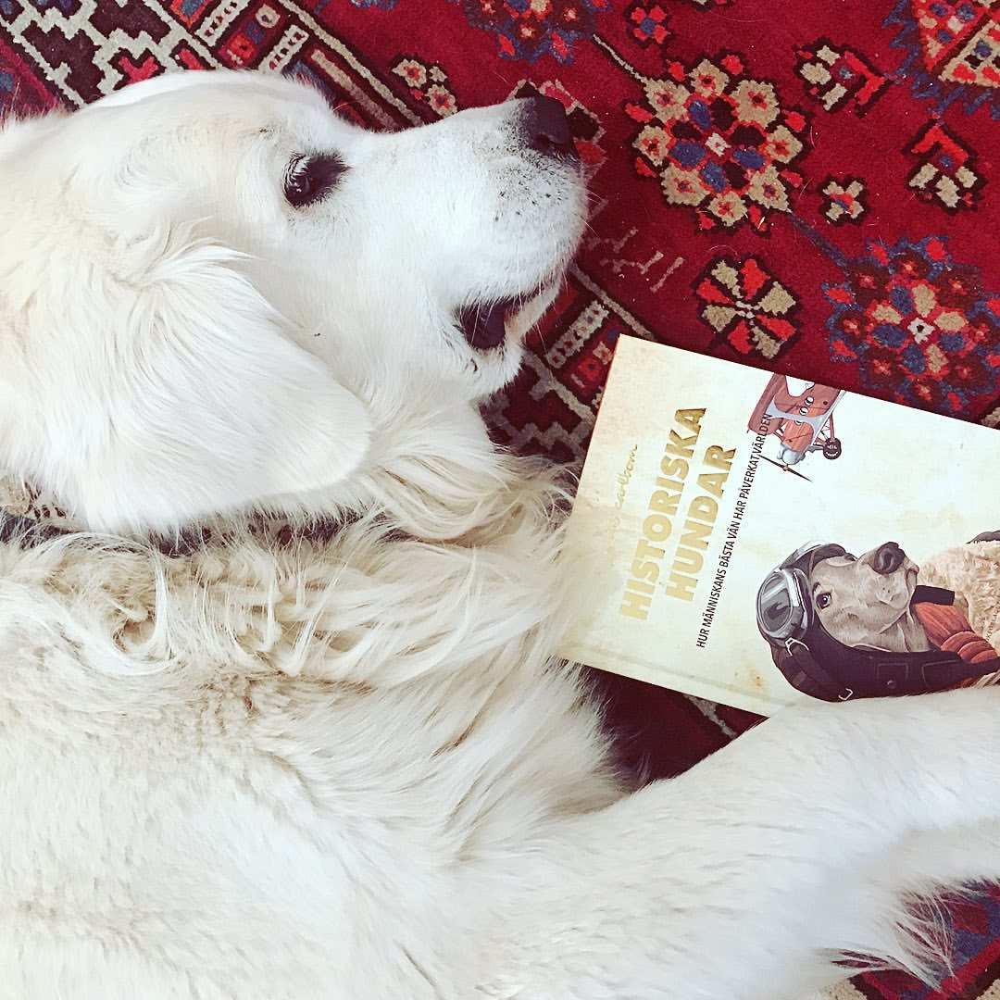

Found 0 boxes for img
1.5965939999999996

<실제 품종: CHIHUAHUEÑO>


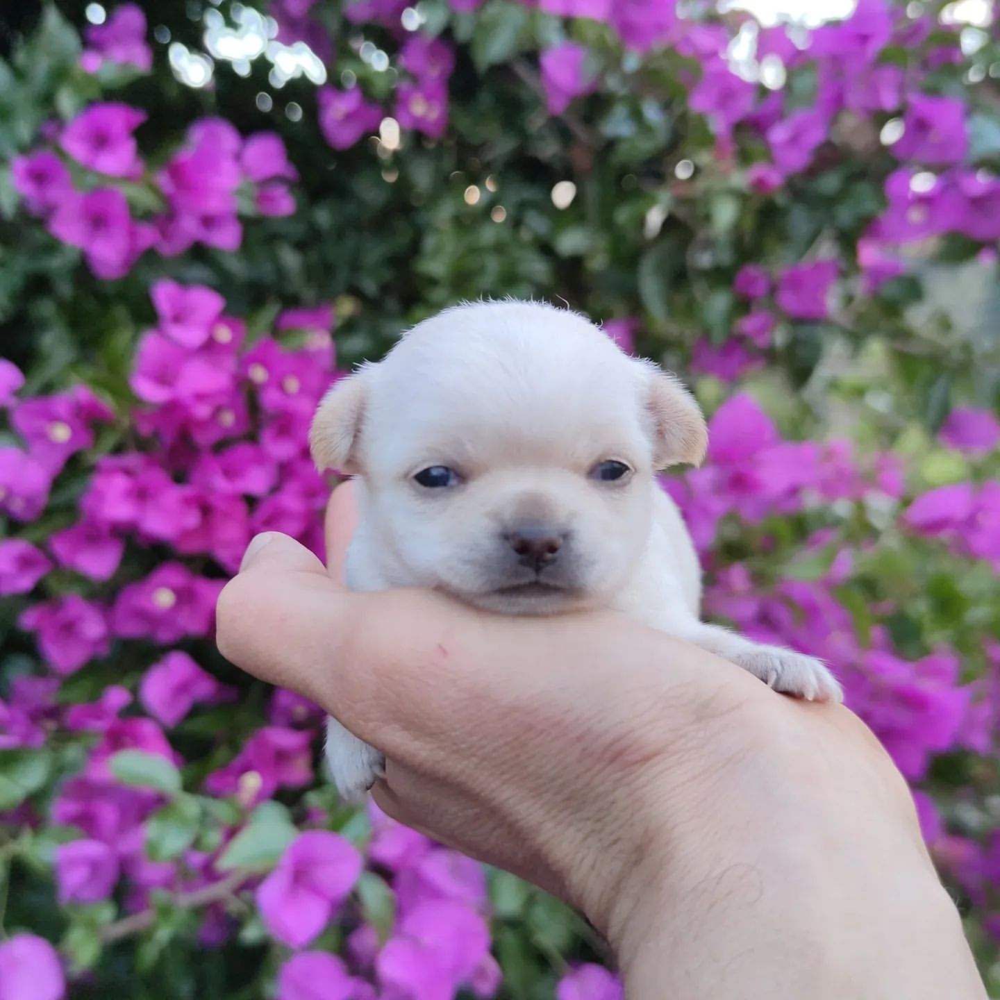

Found 0 boxes for img
0.049809599999999676

<실제 품종: GOLDEN RETRIEVER>


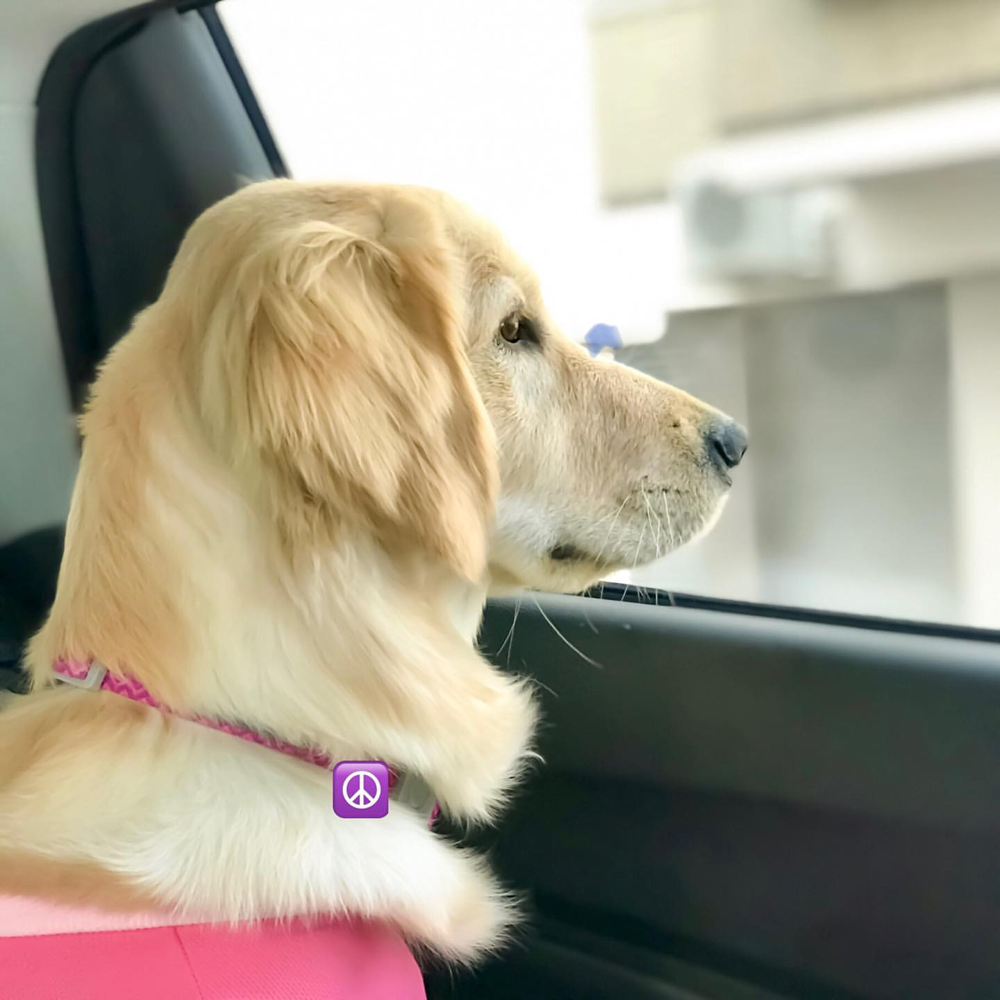

Found 1 boxes for img
KOREA JINDO DOG 0.46 (297, 570) (1139, 1440)
0.05630969999999991

<실제 품종: KOREA JINDO DOG>
예측 품종: KOREA JINDO DOG
모델 자체 점수: 0.4560



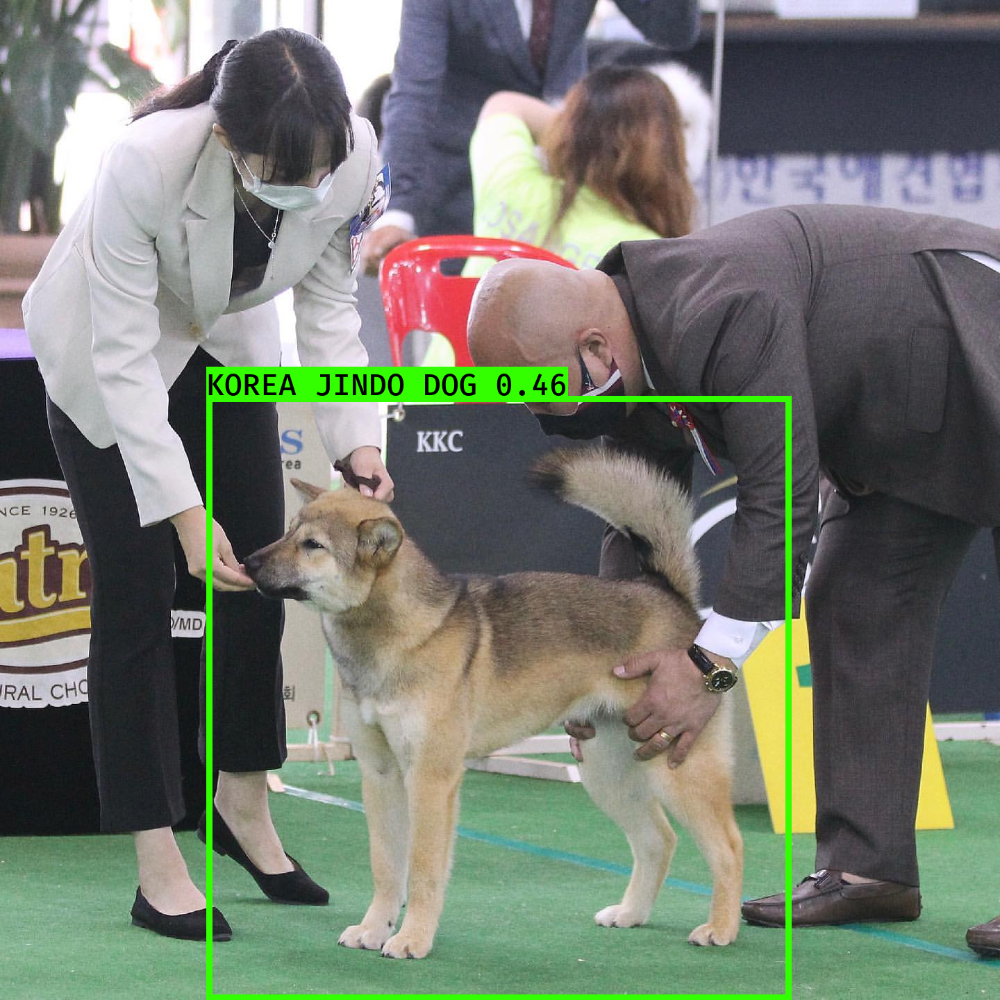

Found 0 boxes for img
1.7589863999999977

<실제 품종: CHIHUAHUEÑO>


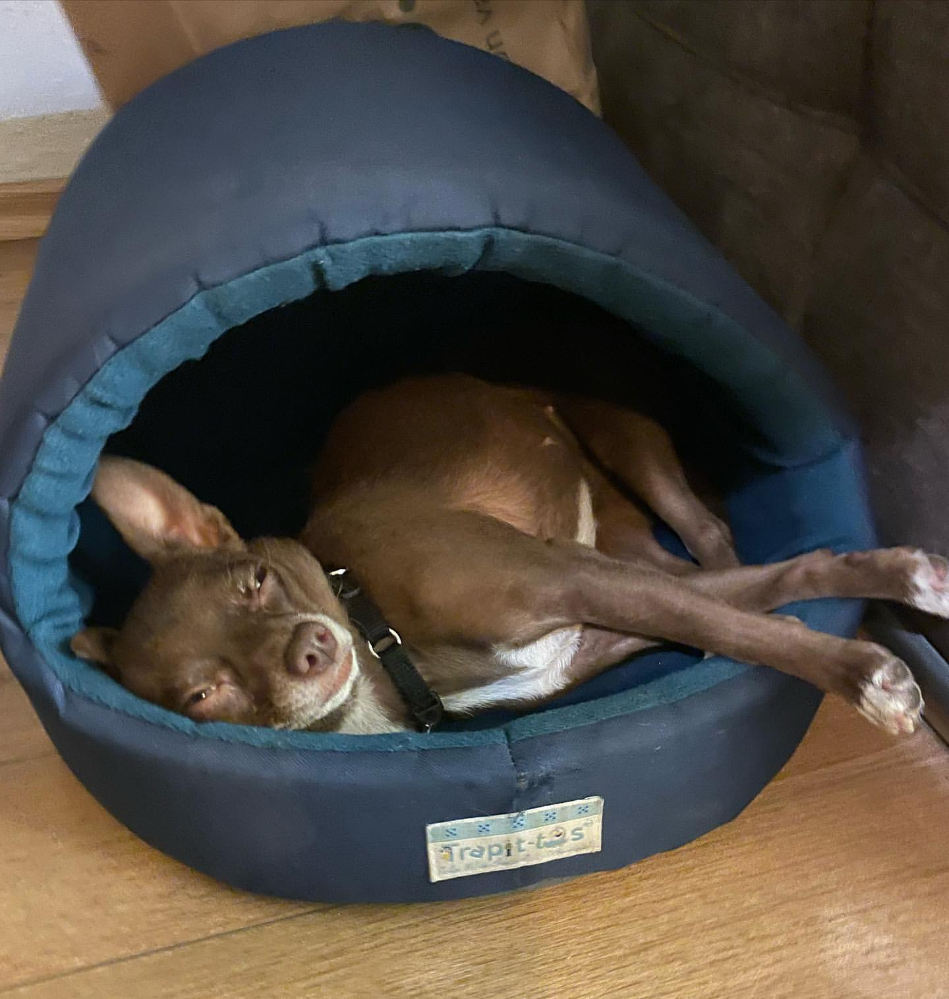

In [9]:
class_breed = {i: name for i, name in enumerate(names)}
yolo.score = 0.4   # 해당 점수 이상인 이미지만 가져오기

for path, class_ in zip(X_test, y_test[:, 0, -1][:5]):
    image = Image.open(path)
    result_image, box_infos = yolo.detect_image(image, box_info=True)
    print(f'\n<실제 품종: {class_breed[class_]}>')
    for breed, bb, score in box_infos:
        print(f'예측 품종: {breed}\n모델 자체 점수: {score:.4f}\n')
    display(result_image)